In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pathlib

import json
from collections import defaultdict


from generate_plots import find_results_json_files, reconcile_results_into_dataframe, get_obfuscation_stats

In [2]:
labeled_bc_dir = pathlib.Path('/home/nika/Desktop/sip_dataset/LABELED-BCs')

df = reconcile_results_into_dataframe(
    find_results_json_files(labeled_bc_dir, lambda path: not path.name.startswith('parallel'))
)

In [3]:
results_table = df.groupby(['data_source', 'obfuscation', 'features'])\
.agg({
    'none': ['mean', 'std'], 
    'sc_guard': ['mean', 'std'], 
    'cfi_verify': ['mean', 'std'], 
    'oh_verify': ['mean', 'std']
}).reset_index()

## Research Question 1

In [4]:
def get_protection_obfuscation_results(df):
    """
    {
        # obfuscation --> protection results
        'NONE': {
            'SC': [0.98, 0.99, 0.99, ...]
            'OH': [0.98, 0.99, 0.99, ...],
            'CFI': [0.98, 0.99, 0.99, ...],
            'NONE': [0.98, 0.99, 0.99, ...]
        },
        'FLA': {
            ...
        },
        'IS100': {
            ...
        }
    }
    """
    plot_results = defaultdict(lambda: defaultdict(list))
    for _, row in df.iterrows():
        obfuscation = row['obfuscation']
        for protection in ['none', 'sc_guard', 'cfi_verify', 'oh_verify']:
            plot_results[obfuscation][protection].append(row[protection])
        
    return plot_results

In [5]:
def mean(nums):
    return sum(nums) / len(nums)

In [6]:
def median(nums):
    return sorted(nums)[len(nums)//2]

In [7]:
def draw_plot(data_values, x_labels, box_plot_labels, plot_title, file_name=None):    

    def set_box_color(bp, color):
        plt.setp(bp['boxes'], color=color)
        plt.setp(bp['whiskers'], color=color)
        plt.setp(bp['caps'], color=color)
        plt.setp(bp['medians'], color=color)
    
    plt.figure(figsize=(10, 4), dpi=300)
    
    # box plots
    box_diff = 0.2
    box_width = 0.08
    colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3']
    base_positions = np.array(range(len(data_values[0]))) + 0.75
    box_plots = [
        plt.boxplot(
            bpvs, 
            positions = base_positions - box_diff * 0.2 + box_diff*i, 
            sym='', 
            widths=box_width
        ) 
        for i, bpvs in enumerate(data_values)
    ]
    [set_box_color(bxplt, color) for bxplt, color in zip(box_plots, colors)]
    
    # plot legend
    [plt.plot([], c=color, label=bxl) for bxl, color in zip(box_plot_labels, colors)]
    plt.legend(prop={'size': 8}) # loc=4, 

    # title
    if plot_title is not None:
        plt.title(plot_title)
    
    # labels and axis
    plt.xticks(range(1, len(x_labels) + 1), x_labels, size=9)
    plt.xlim(0.5, len(x_labels) + 2)
    plt.ylim(0, 1.1)
    plt.tight_layout()
    
    ax = plt.gca()
    for tick in ax.get_xticklabels():
        tick.set_rotation(45)
    
    plt.gcf().subplots_adjust(bottom=0.2)
    
    # write file
    if file_name is not None:
        plt.savefig(file_name)

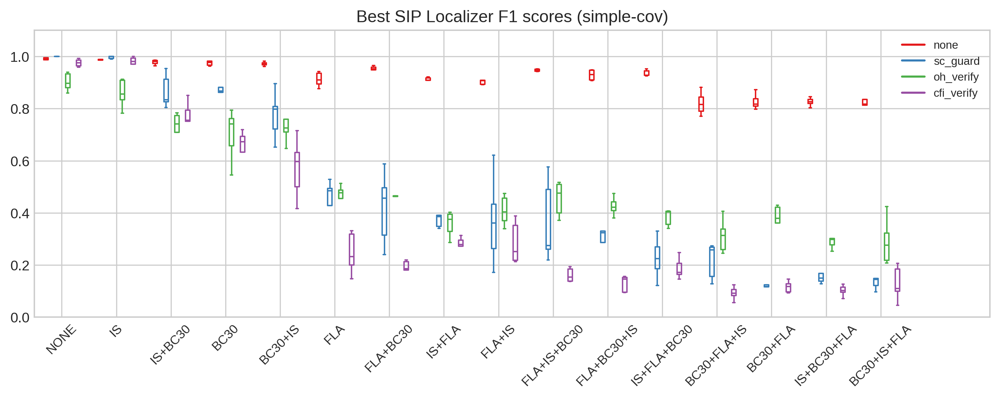

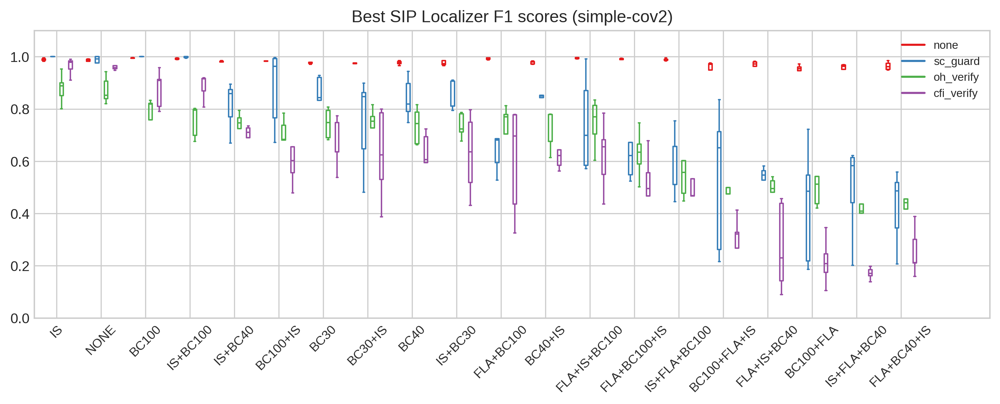

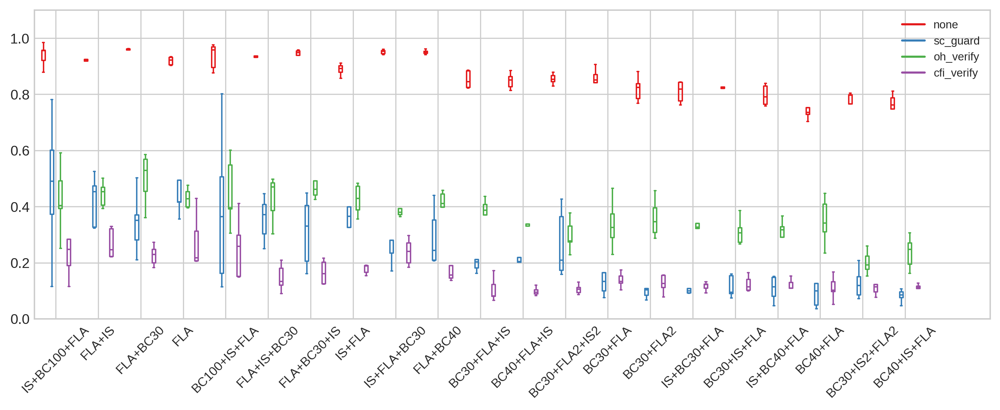

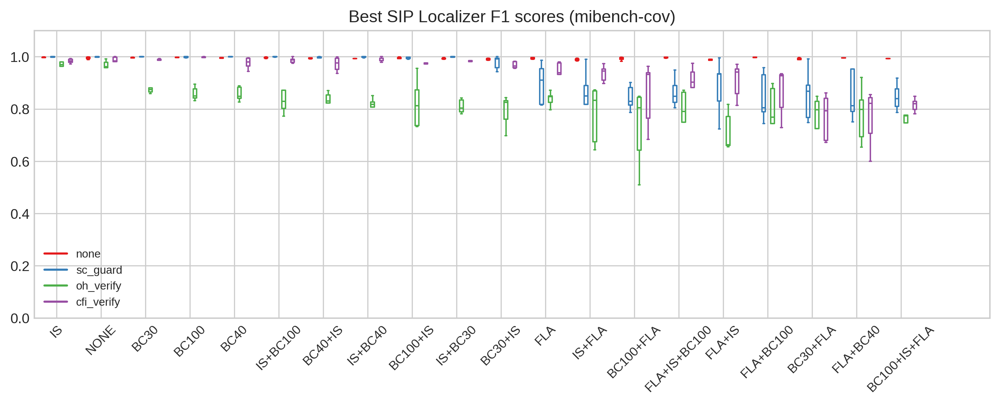

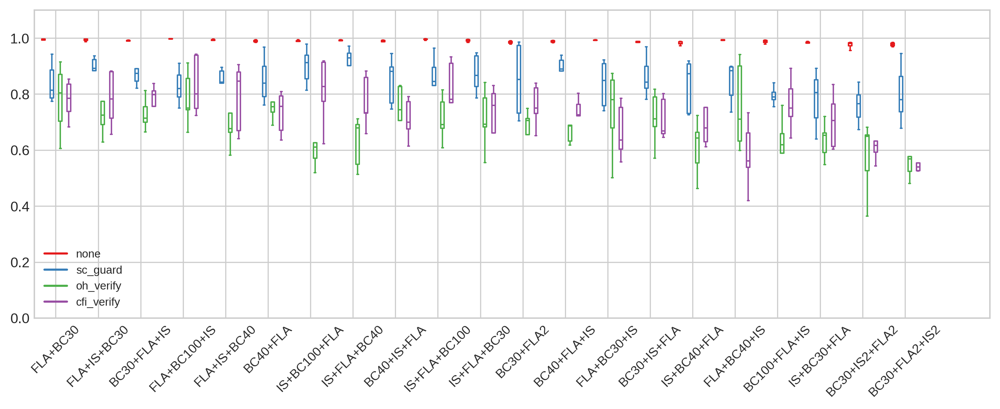

In [8]:
# source dataset -> list of obfuscations
obfuscation_orders = {}

for src_dataset in ['simple-cov', 'simple-cov2', 'mibench-cov']:
    plot_data = get_protection_obfuscation_results(
        df[(df['data_source'] == src_dataset) & (df['features'] == 'pdg + tf_idf + ir2vec + code2vec')]
    )
    
    # order obfuscations by mean box plot 
    obfuscation_labels = sorted(
        plot_data.keys(), 
        key=lambda obfs: mean([median(protection_results) for protection_results in plot_data[obfs].values()]),
        reverse=True
    )
    obfuscation_orders[src_dataset] = obfuscation_labels
    
    box_plots_order = ['none', 'sc_guard', 'oh_verify', 'cfi_verify']
    
    if len(obfuscation_labels) > 20:
        part1_obfs_labels = obfuscation_labels[:20]
        data_values = [[plot_data[obfs][prot] for obfs in part1_obfs_labels] for prot in box_plots_order]

        plot_title = f'Best SIP Localizer F1 scores ({src_dataset})'

        draw_plot(
            data_values, 
            part1_obfs_labels, 
            box_plots_order, 
            plot_title, 
            file_name=f'plots/{src_dataset}_best_sip_localizer_f1_score_part_1.pdf'
        )
        
        
        
        part2_obfs_labels = obfuscation_labels[20:]
        data_values = [[plot_data[obfs][prot] for obfs in part2_obfs_labels] for prot in box_plots_order]

        draw_plot(
            data_values, 
            part2_obfs_labels, 
            box_plots_order, 
            plot_title=None, 
            file_name=f'plots/{src_dataset}_best_sip_localizer_f1_score_part_2.pdf'
        )
        
    else:
        data_values = [[plot_data[obfs][prot] for obfs in obfuscation_labels] for prot in box_plots_order]

        plot_title = f'Best SIP Localizer F1 scores ({src_dataset})'

        draw_plot(
            data_values, 
            obfuscation_labels, 
            box_plots_order, 
            plot_title, 
            file_name=f'plots/{src_dataset}_best_sip_localizer_f1_score.pdf'
        )

In [9]:
df1_simple = results_table[
    (results_table['data_source'] == 'simple-cov') & 
    (results_table['features'] == 'pdg + tf_idf + ir2vec + code2vec')
].set_index('obfuscation')[
    [('none', 'mean'), ('none', 'std'), 
     ('sc_guard', 'mean'), ('sc_guard', 'std'), 
     ('cfi_verify', 'mean'), ('cfi_verify', 'std'), 
     ('oh_verify', 'mean'), ('oh_verify', 'std')]
].reindex(obfuscation_orders['simple-cov'])
df1_simple

none            sc_guard           cfi_verify            \
                 mean       std      mean       std       mean       std   
obfuscation                                                                
NONE         0.991275  0.003785  0.998095  0.004259   0.975589  0.014046   
IS           0.987353  0.004611  0.996640  0.004693   0.970042  0.037911   
IS+BC30      0.977880  0.009046  0.866120  0.063923   0.744845  0.104519   
BC30         0.973934  0.008878  0.845456  0.115918   0.649253  0.074912   
BC30+IS      0.971599  0.007647  0.775365  0.092129   0.572038  0.116389   
FLA          0.912022  0.027610  0.441586  0.101662   0.246320  0.078543   
FLA+BC30     0.949178  0.017610  0.419012  0.140541   0.175501  0.057527   
IS+FLA       0.909331  0.012368  0.386370  0.049865   0.277875  0.031521   
FLA+IS       0.908233  0.019825  0.370165  0.171733   0.284719  0.080609   
FLA+IS+BC30  0.947445  0.004628  0.364540  0.158514   0.161736  0.026725   
FLA+BC30+IS  0.928581  0.019879  0.309649  0.126146   0.129201  0.031522   
IS+FLA+BC30  0.939056  0.011600  0.226433  0.079511   0.187409  0.040586   
BC30+FLA+IS  0.820643  0.043440  0.217172  0.069259   0.092596  0.025809   
BC30+FLA     0.826676  0.029386  0.120891  0.027254   0.116507  0.022092   
IS+BC30+FLA  0.826017  0.015889  0.174998  0.066313   0.102221  0.020975   
BC30+IS+FLA  0.811886  0.061509  0.145655  0.044241   0.129156  0.066129   

            oh_verify            
                 mean       std  
obfuscation                      
NONE         0.901645  0.034254  
IS           0.858534  0.054300  
IS+BC30      0.703971  0.111446  
BC30         0.700193  0.100094  
BC30+IS      0.736354  0.070989  
FLA          0.458698  0.059509  
FLA+BC30     0.460543  0.043159  
IS+FLA       0.357690  0.048965  
FLA+IS       0.409064  0.056454  
FLA+IS+BC30  0.454948  0.065557  
FLA+BC30+IS  0.425289  0.035313  
IS+FLA+BC30  0.382929  0.031949  
BC30+FLA+IS  0.312668  0.064433  
BC30+FLA     0.366257  0.076533  
IS+BC30+FLA  0.295991  0.035466  
BC30+IS+FLA  0.289951  0.088541

In [10]:
print(df1_simple.to_latex(
    float_format='%0.3f', bold_rows=True, label='tab:best_model_sip_f1_score_on_mibench_cov'
))

\begin{table}
\centering
\label{tab:best_model_sip_f1_score_on_mibench_cov}
\begin{tabular}{lrrrrrrrr}
\toprule
{} & \multicolumn{2}{l}{none} & \multicolumn{2}{l}{sc\_guard} & \multicolumn{2}{l}{cfi\_verify} & \multicolumn{2}{l}{oh\_verify} \\
{} &  mean &   std &     mean &   std &       mean &   std &      mean &   std \\
\textbf{obfuscation} &       &       &          &       &            &       &           &       \\
\midrule
\textbf{NONE       } & 0.991 & 0.004 &    0.998 & 0.004 &      0.976 & 0.014 &     0.902 & 0.034 \\
\textbf{IS         } & 0.987 & 0.005 &    0.997 & 0.005 &      0.970 & 0.038 &     0.859 & 0.054 \\
\textbf{IS+BC30    } & 0.978 & 0.009 &    0.866 & 0.064 &      0.745 & 0.105 &     0.704 & 0.111 \\
\textbf{BC30       } & 0.974 & 0.009 &    0.845 & 0.116 &      0.649 & 0.075 &     0.700 & 0.100 \\
\textbf{BC30+IS    } & 0.972 & 0.008 &    0.775 & 0.092 &      0.572 & 0.116 &     0.736 & 0.071 \\
\textbf{FLA        } & 0.912 & 0.028 &    0.442 & 0.102 &      0.

In [11]:
df1_mibench = results_table[
    (results_table['data_source'] == 'mibench-cov') & 
    (results_table['features'] == 'pdg + tf_idf + ir2vec + code2vec')
].set_index('obfuscation')[
    [('none', 'mean'), ('none', 'std'), 
     ('sc_guard', 'mean'), ('sc_guard', 'std'), 
     ('cfi_verify', 'mean'), ('cfi_verify', 'std'), 
     ('oh_verify', 'mean'), ('oh_verify', 'std')]
].reindex(obfuscation_orders['mibench-cov'])
df1_mibench

none            sc_guard           cfi_verify            \
                   mean       std      mean       std       mean       std   
obfuscation                                                                  
IS             0.996155  0.002912  0.997188  0.005119   0.983212  0.008466   
NONE           0.994923  0.004260  0.998944  0.001158   0.970664  0.045765   
BC30           0.996218  0.001186  0.998725  0.002118   0.984122  0.011831   
BC100          0.997199  0.000907  0.998400  0.002225   0.994268  0.009951   
BC40           0.995467  0.001617  0.994310  0.012449   0.975200  0.021865   
IS+BC100       0.995876  0.002010  0.999327  0.000969   0.986348  0.009900   
BC40+IS        0.993645  0.001814  0.992464  0.012899   0.971184  0.027079   
IS+BC40        0.993619  0.002103  0.998351  0.001824   0.988412  0.008347   
BC100+IS       0.995265  0.002775  0.995225  0.003513   0.970035  0.021816   
IS+BC30        0.992681  0.002391  0.999287  0.000986   0.983323  0.009928   
BC30+IS        0.990558  0.003484  0.976999  0.025189   0.968128  0.012715   
FLA            0.993305  0.002908  0.896811  0.078550   0.938158  0.046604   
IS+FLA         0.988518  0.004343  0.837922  0.127089   0.935680  0.031330   
BC100+FLA      0.991566  0.006190  0.842717  0.047557   0.856159  0.124772   
FLA+IS+BC100   0.996437  0.001932  0.863525  0.056800   0.893811  0.078410   
FLA+IS         0.986666  0.004906  0.883494  0.107287   0.907312  0.068190   
FLA+BC100      0.996285  0.002938  0.845630  0.093449   0.865555  0.093715   
BC30+FLA       0.988419  0.008552  0.853055  0.098741   0.769653  0.089018   
FLA+BC40       0.994343  0.003268  0.851562  0.094932   0.765458  0.109507   
BC100+IS+FLA   0.989266  0.009789  0.845931  0.052780   0.815423  0.026018   
FLA+BC30       0.993582  0.003765  0.840621  0.071657   0.778909  0.070332   
FLA+IS+BC30    0.993402  0.003858  0.877576  0.073361   0.782930  0.100257   
BC30+FLA+IS    0.989007  0.004582  0.879278  0.053851   0.745638  0.127005   
FLA+BC100+IS   0.996464  0.001614  0.827377  0.063087   0.830556  0.104148   
FLA+IS+BC40    0.993595  0.002400  0.847165  0.046697   0.788081  0.123742   
BC40+FLA       0.989641  0.004055  0.851640  0.083546   0.733093  0.076522   
IS+BC100+FLA   0.988429  0.005477  0.899606  0.065660   0.811196  0.121530   
IS+FLA+BC40    0.991866  0.001325  0.907171  0.071490   0.773193  0.094713   
BC40+IS+FLA    0.984999  0.011442  0.847056  0.085956   0.710776  0.072451   
IS+FLA+BC100   0.995342  0.002057  0.852108  0.088277   0.789777  0.149668   
IS+FLA+BC30    0.990827  0.004311  0.872611  0.069319   0.694831  0.165799   
BC30+FLA2      0.985448  0.004722  0.849746  0.131051   0.758587  0.075735   
BC40+FLA+IS    0.988164  0.003181  0.878819  0.068398   0.733948  0.055288   
FLA+BC30+IS    0.991105  0.004684  0.835788  0.083764   0.666711  0.097676   
BC30+IS+FLA    0.986893  0.003740  0.862573  0.073103   0.711292  0.074032   
IS+BC40+FLA    0.981721  0.006011  0.831210  0.095542   0.685314  0.066029   
FLA+BC40+IS    0.991263  0.004624  0.841915  0.073142   0.582581  0.120138   
BC100+FLA+IS   0.987202  0.005900  0.794550  0.031693   0.764771  0.095078   
IS+BC30+FLA    0.981828  0.006444  0.780265  0.102819   0.704059  0.098941   
BC30+IS2+FLA2  0.975251  0.011829  0.759264  0.066076   0.617691  0.058344   
BC30+FLA2+IS2  0.976746  0.006433  0.800476  0.105219   0.561442  0.057046   

              oh_verify            
                   mean       std  
obfuscation                        
IS             0.958444  0.033469  
NONE           0.942963  0.067254  
BC30           0.884572  0.034522  
BC100          0.859236  0.026330  
BC40           0.857537  0.026903  
IS+BC100       0.829227  0.043416  
BC40+IS        0.826054  0.045205  
IS+BC40        0.815715  0.027118  
BC100+IS       0.822106  0.094266  
IS+BC30        0.809987  0.026969  
BC30+IS        0.791924  0.061627  
FLA            0.838200  0.027998  
IS+FLA         0.778708  0.110731  
BC100+FLA 

In [12]:
print(df1_mibench.to_latex(
    float_format='%0.3f', bold_rows=True, longtable=True, label='tab:best_model_sip_f1_score_on_mibench_cov'
))

\begin{longtable}{lrrrrrrrr}
\label{tab:best_model_sip_f1_score_on_mibench_cov}\\
\toprule
{} & \multicolumn{2}{l}{none} & \multicolumn{2}{l}{sc\_guard} & \multicolumn{2}{l}{cfi\_verify} & \multicolumn{2}{l}{oh\_verify} \\
{} &  mean &   std &     mean &   std &       mean &   std &      mean &   std \\
\textbf{obfuscation  } &       &       &          &       &            &       &           &       \\
\midrule
\endfirsthead

\toprule
{} & \multicolumn{2}{l}{none} & \multicolumn{2}{l}{sc\_guard} & \multicolumn{2}{l}{cfi\_verify} & \multicolumn{2}{l}{oh\_verify} \\
{} &  mean &   std &     mean &   std &       mean &   std &      mean &   std \\
\textbf{obfuscation  } &       &       &          &       &            &       &           &       \\
\midrule
\endhead
\midrule
\multicolumn{9}{r}{{Continued on next page}} \\
\midrule
\endfoot

\bottomrule
\endlastfoot
\textbf{IS           } & 0.996 & 0.003 &    0.997 & 0.005 &      0.983 & 0.008 &     0.958 & 0.033 \\
\textbf{NONE         } 

In [13]:
df.head()

,data_source,obfuscation,features,sc_guard,cfi_verify,oh_verify,none
0,simple-cov2,BC30+IS2+FLA2,ir2vec,0.121495,0.154251,0.276744,0.866310
1,simple-cov2,BC30+IS2+FLA2,pdg + tf_idf + ir2vec + code2vec,0.071905,0.114458,0.152261,0.706187
2,simple-cov2,BC30+IS2+FLA2,pdg + tf_idf,0.094731,0.065344,0.107276,0.621821
3,simple-cov2,BC30+IS2+FLA2,pdg + tf_idf + ir2vec,0.078125,0.110887,0.235955,0.781415
4,simple-cov2,BC30+IS2+FLA2,pdg,0.053516,0.056917,0.081264,0.405484


## Research Question 2

In [14]:
def get_feature_obfuscation_results(df, protection):
    """
    {
        # obfuscation --> feature results
        'NONE': {
            'pdg': [0.98, 0.99, 0.99, ...],
            'tf_idf': [0.98, 0.99, 0.99, ...],
            'ir2vec': [0.98, 0.99, 0.99, ...],
            'code2vec': [0.98, 0.99, 0.99, ...]
        },
        'FLA': {
            ...
        },
        'IS100': {
            ...
        }
    }
    """
    plot_results = defaultdict(lambda: defaultdict(list))
    for _, row in df.iterrows():
        obfuscation = row['obfuscation']
        feature = row['features']
        plot_results[obfuscation][feature].append(row[protection])
        
    return plot_results

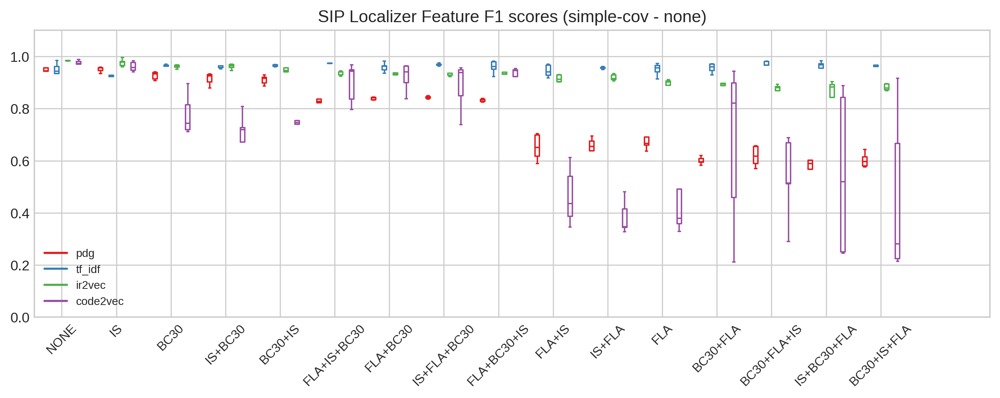

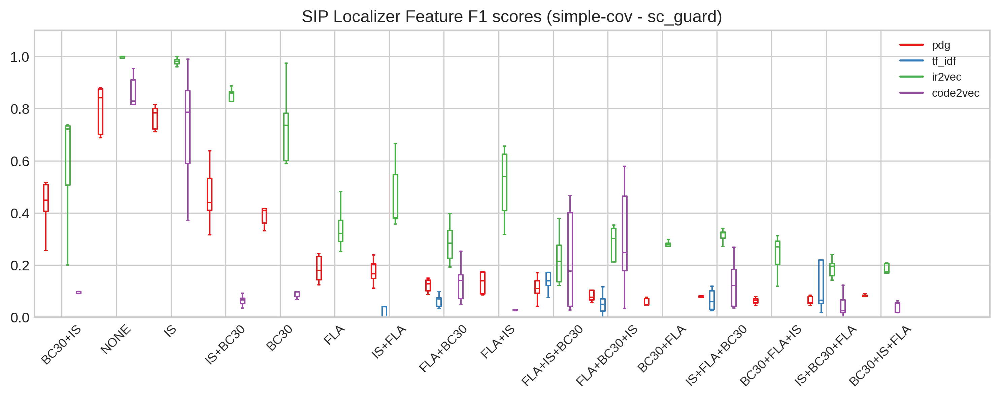

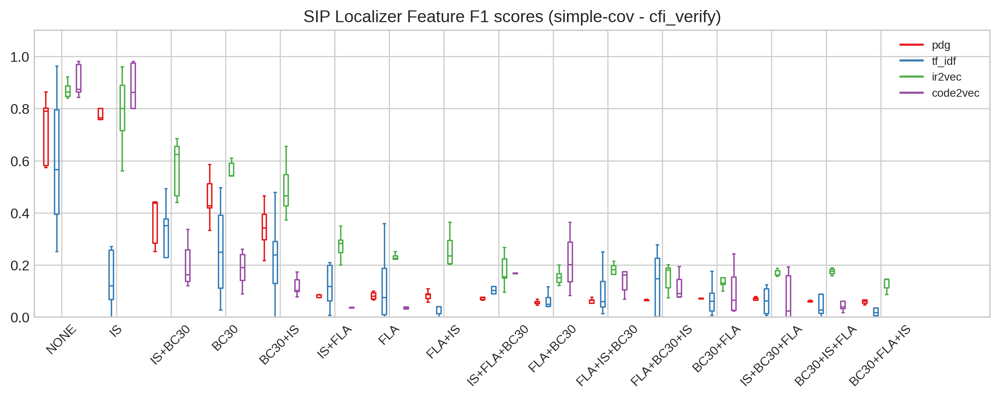

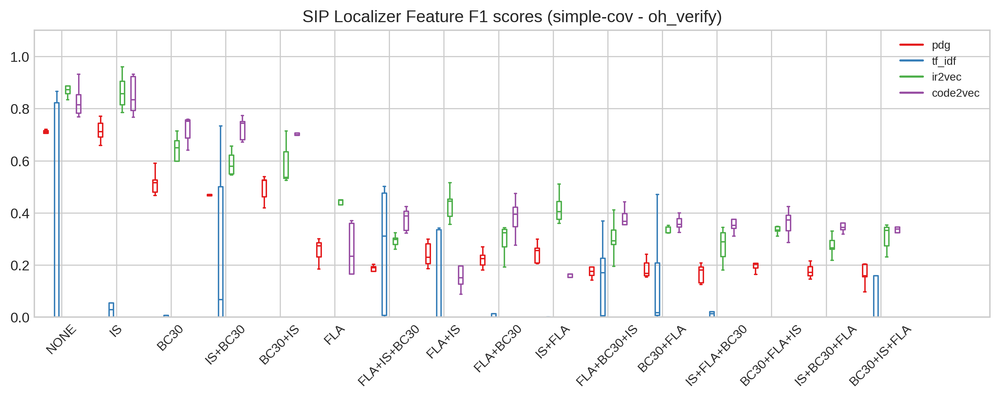

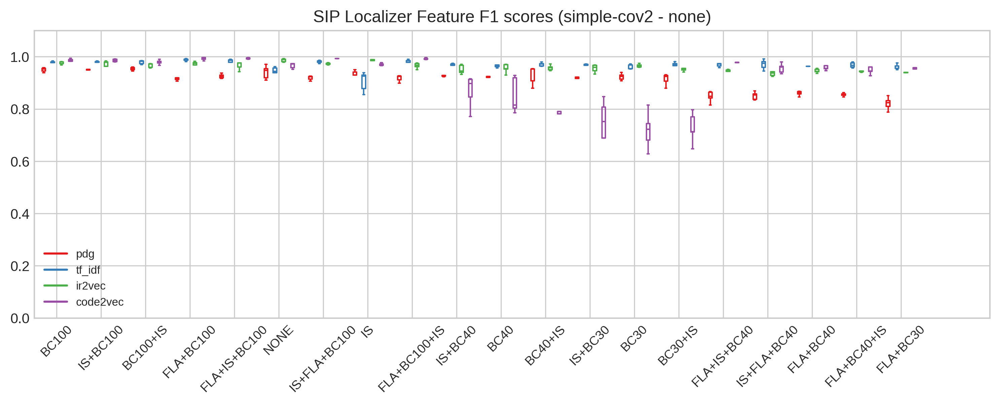

...

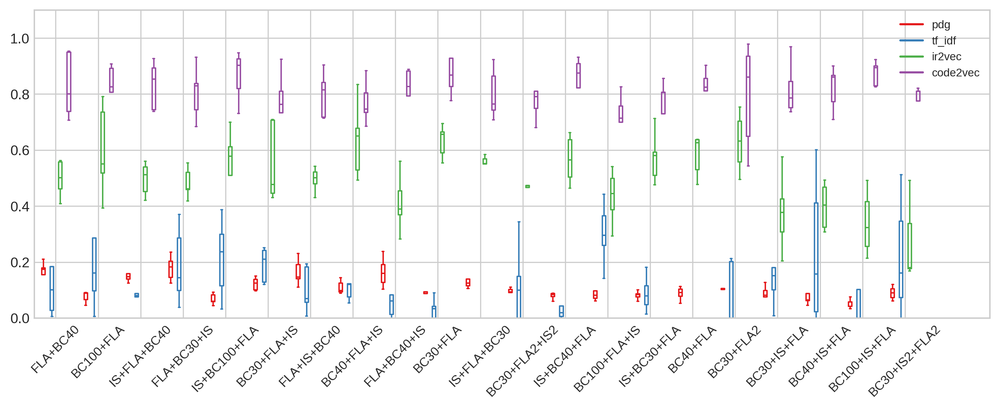

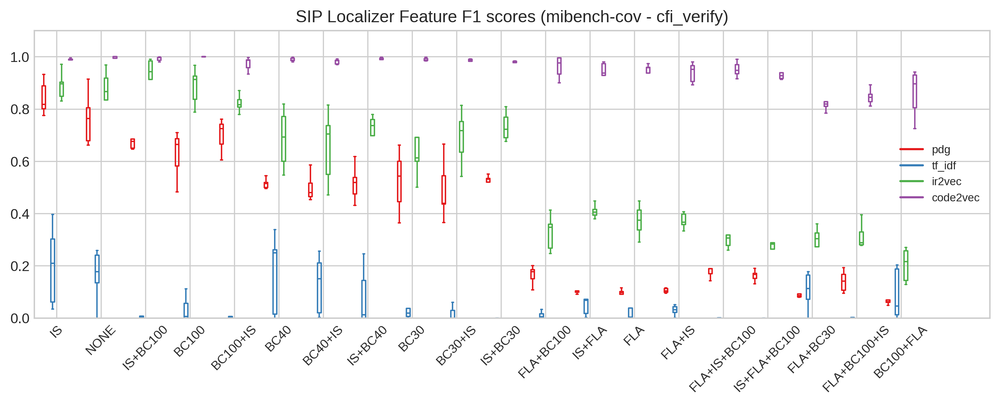

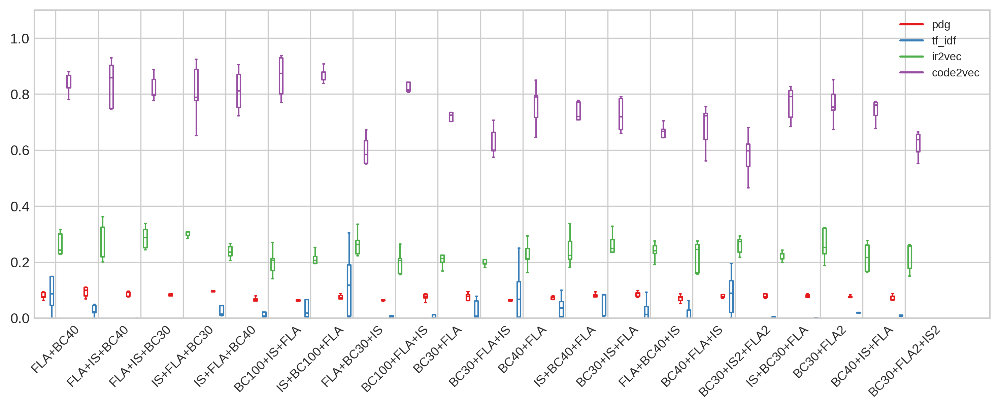

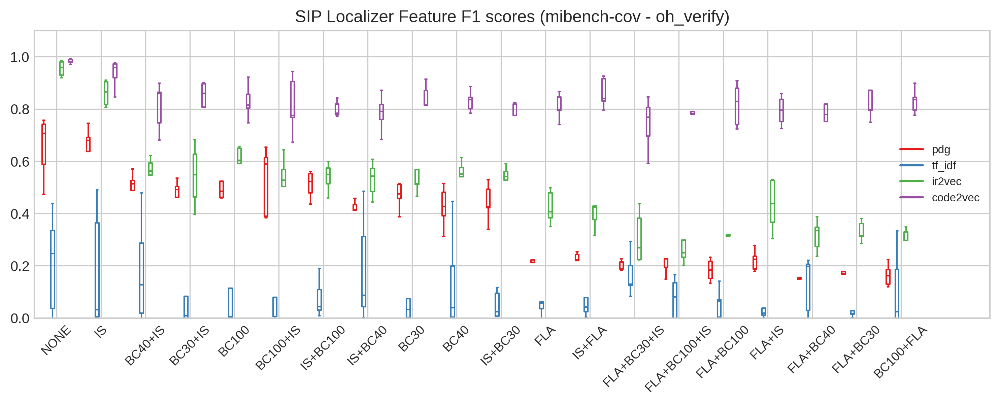

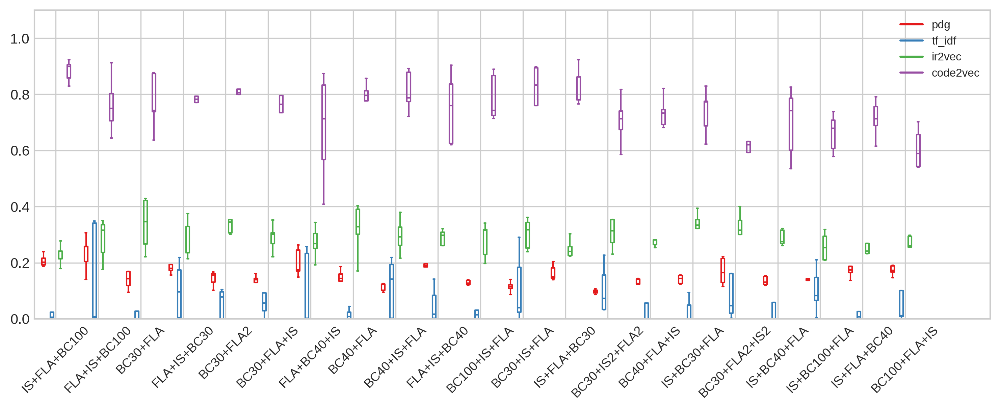

In [15]:
# source dataset -> list of obfuscations
obfuscation_orders = {}

for src_dataset in ['simple-cov', 'simple-cov2', 'mibench-cov']:
    for protection in ['none', 'sc_guard', 'cfi_verify', 'oh_verify']:
        plot_data = get_feature_obfuscation_results(
            df[(df['data_source'] == src_dataset)], protection
        )

        # order obfuscations by mean box plot 
        obfuscation_labels = sorted(
            plot_data.keys(), 
            key=lambda obfs: mean([median(protection_results) for protection_results in plot_data[obfs].values()]),
            reverse=True
        )
        obfuscation_orders[src_dataset] = obfuscation_labels

        box_plots_order = ['pdg', 'tf_idf', 'ir2vec', 'code2vec']

        if len(obfuscation_labels) > 20:
            part1_obfs_labels = obfuscation_labels[:20]
            data_values = [[plot_data[obfs][prot] for obfs in part1_obfs_labels] for prot in box_plots_order]

            plot_title = f'SIP Localizer Feature F1 scores ({src_dataset} - {protection})'

            draw_plot(
                data_values, 
                part1_obfs_labels, 
                box_plots_order, 
                plot_title, 
                file_name=f'plots/{src_dataset}_{protection}_feature_f1_scores_part_1.pdf'
            )



            part2_obfs_labels = obfuscation_labels[20:]
            data_values = [[plot_data[obfs][prot] for obfs in part2_obfs_labels] for prot in box_plots_order]

            draw_plot(
                data_values, 
                part2_obfs_labels, 
                box_plots_order, 
                plot_title=None, 
                file_name=f'plots/{src_dataset}_{protection}_feature_f1_scores_part_2.pdf'
            )

        else:
            data_values = [[plot_data[obfs][prot] for obfs in obfuscation_labels] for prot in box_plots_order]

            plot_title = f'SIP Localizer Feature F1 scores ({src_dataset} - {protection})'

            draw_plot(
                data_values, 
                obfuscation_labels, 
                box_plots_order, 
                plot_title, 
                file_name=f'plots/{src_dataset}_{protection}_feature_f1_scores.pdf'
            )

In [16]:
df

,data_source,obfuscation,features,sc_guard,cfi_verify,oh_verify,none
0,simple-cov2,BC30+IS2+FLA2,ir2vec,0.121495,0.154251,0.276744,0.866310
1,simple-cov2,BC30+IS2+FLA2,pdg + tf_idf + ir2vec + code2vec,0.071905,0.114458,0.152261,0.706187
2,simple-cov2,BC30+IS2+FLA2,pdg + tf_idf,0.094731,0.065344,0.107276,0.621821
3,simple-cov2,BC30+IS2+FLA2,pdg + tf_idf + ir2vec,0.078125,0.110887,0.235955,0.781415
4,simple-cov2,BC30+IS2+FLA2,pdg,0.053516,0.056917,0.081264,0.405484
...,...,...,...,...,...,...,...
3784,simple-cov,FLA+IS+BC30,pdg + tf_idf + ir2vec,0.240418,0.134119,0.358900,0.932928
3785,simple-cov,FLA+IS+BC30,pdg,0.092105,0.076427,0.194030,0.856959
3786,simple-cov,FLA+IS+BC30,pdg + ir2vec,0.207885,0.098967,0.222222,0.896130
3787,simple-cov,FLA+IS+BC30,tf_idf,0.171429,0.250000,0.311057,0.973190


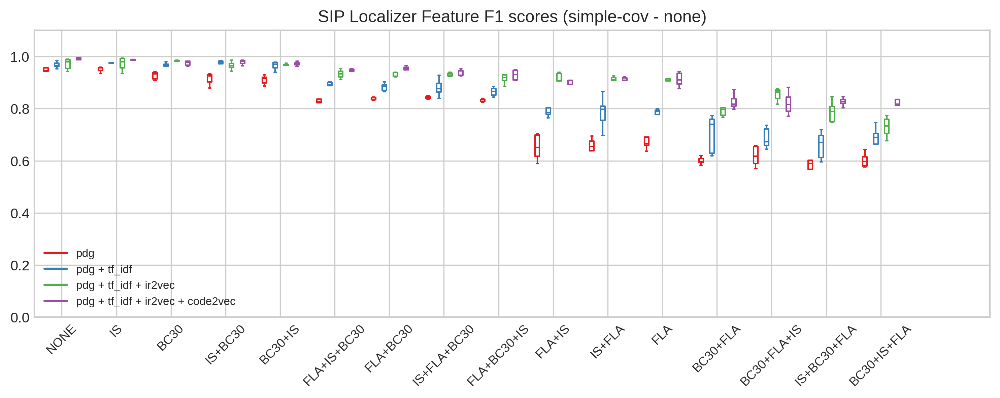

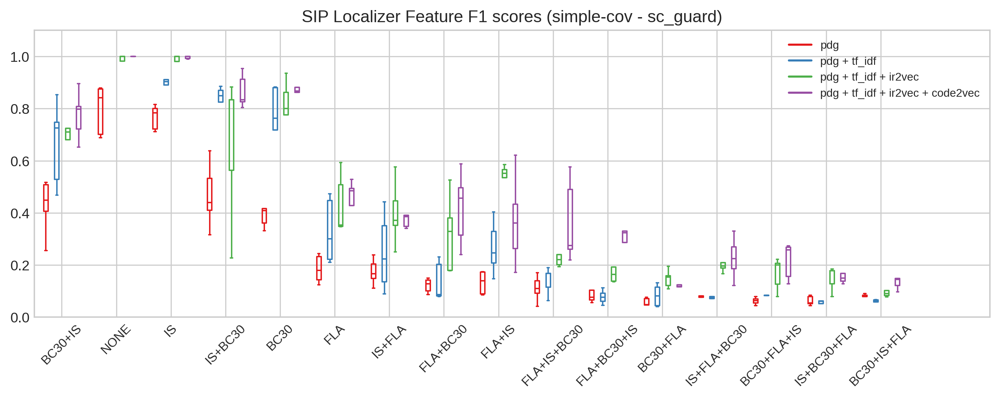

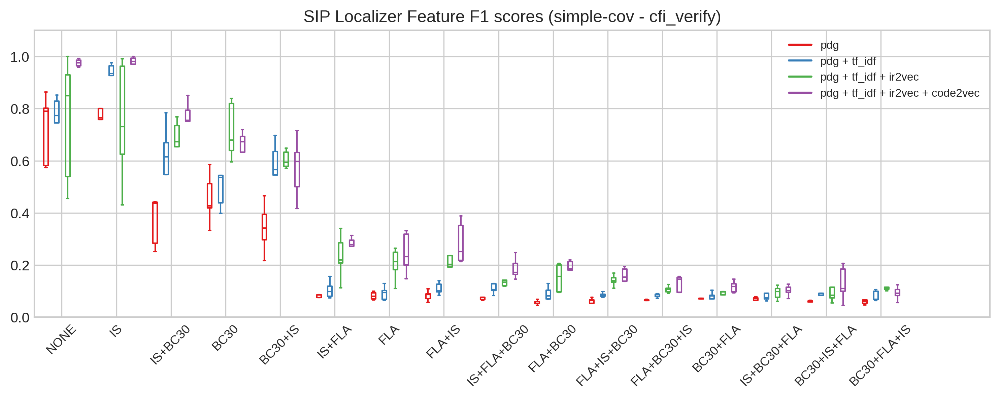

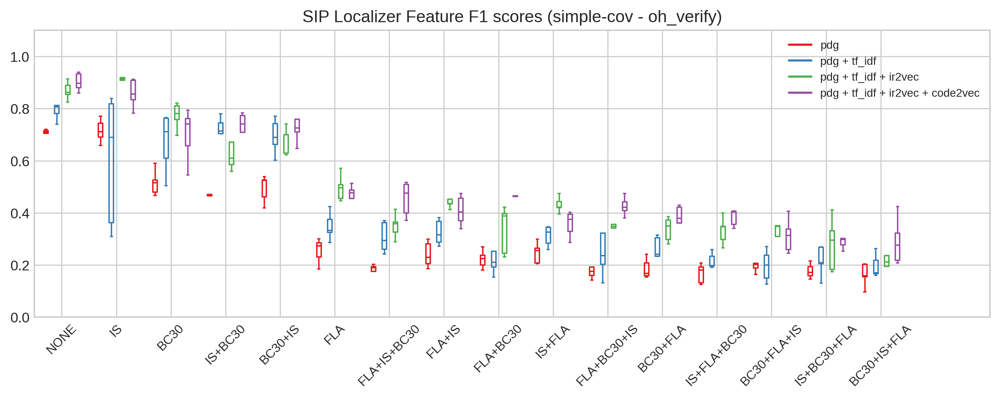

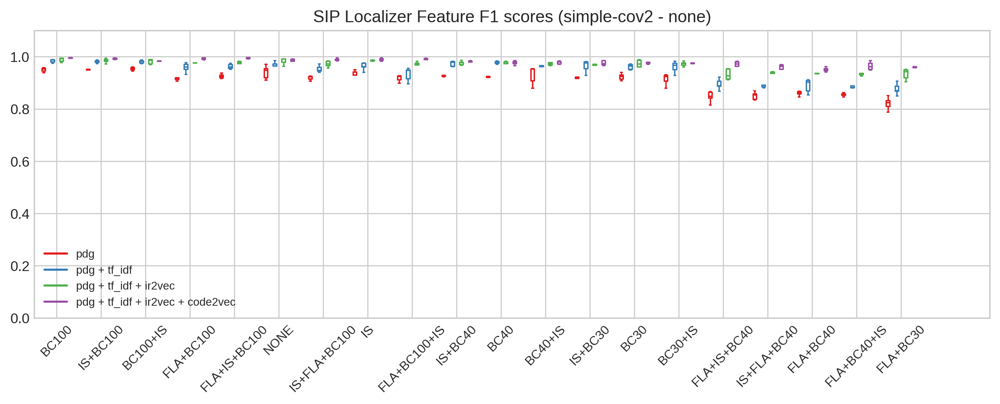

...

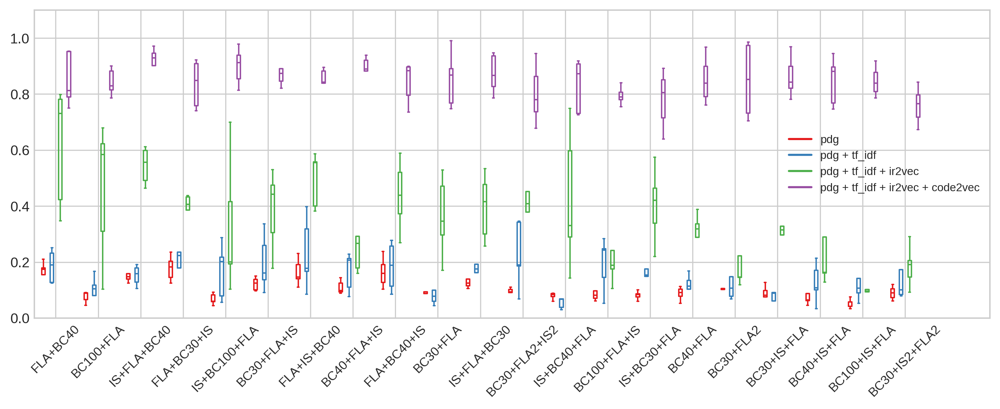

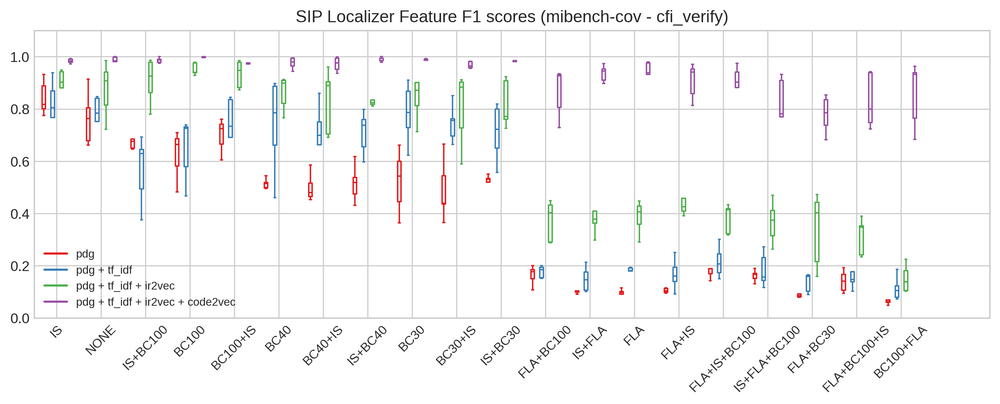

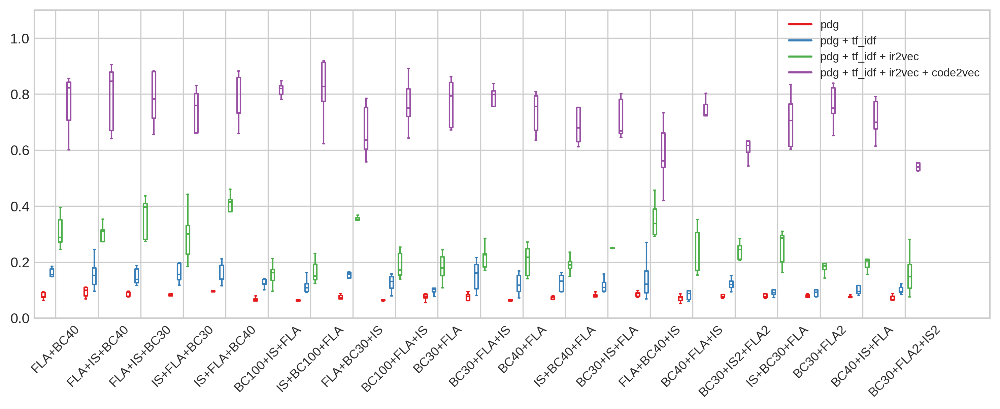

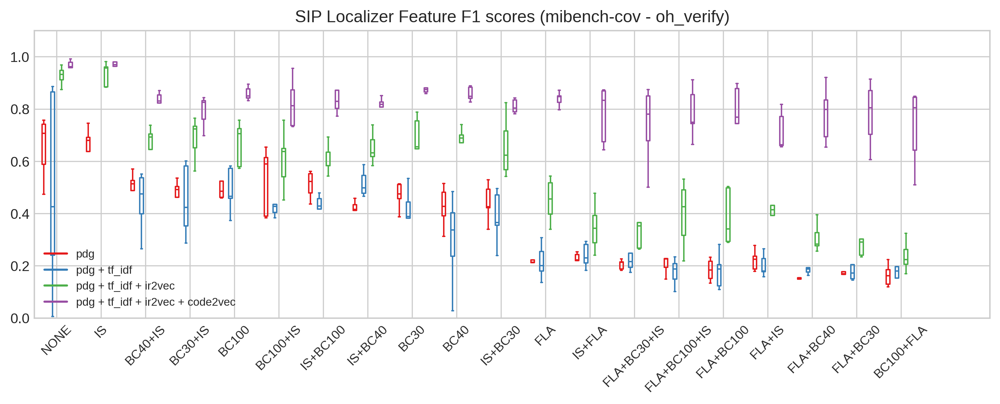

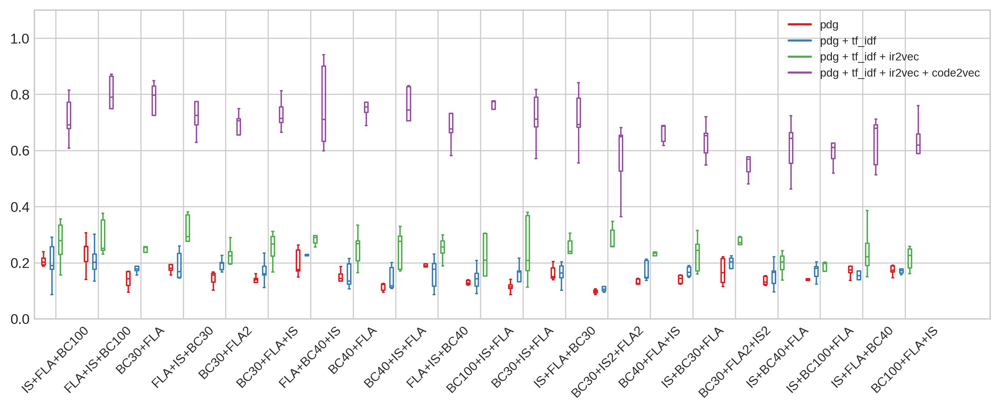

In [17]:
# source dataset -> list of obfuscations
obfuscation_orders = {}

for src_dataset in ['simple-cov', 'simple-cov2', 'mibench-cov']:
    for protection in ['none', 'sc_guard', 'cfi_verify', 'oh_verify']:
        plot_data = get_feature_obfuscation_results(
            df[(df['data_source'] == src_dataset)], protection
        )

        # order obfuscations by mean box plot 
        obfuscation_labels = sorted(
            plot_data.keys(), 
            key=lambda obfs: mean([median(protection_results) for protection_results in plot_data[obfs].values()]),
            reverse=True
        )
        obfuscation_orders[src_dataset] = obfuscation_labels

        box_plots_order = ['pdg', 'pdg + tf_idf', 'pdg + tf_idf + ir2vec', 'pdg + tf_idf + ir2vec + code2vec']

        if len(obfuscation_labels) > 20:
            part1_obfs_labels = obfuscation_labels[:20]
            data_values = [[plot_data[obfs][prot] for obfs in part1_obfs_labels] for prot in box_plots_order]

            plot_title = f'SIP Localizer Feature F1 scores ({src_dataset} - {protection})'

            draw_plot(
                data_values, 
                part1_obfs_labels, 
                box_plots_order, 
                plot_title, 
                file_name=f'plots/{src_dataset}_{protection}_all_features_f1_scores_part_1.pdf'
            )



            part2_obfs_labels = obfuscation_labels[20:]
            data_values = [[plot_data[obfs][prot] for obfs in part2_obfs_labels] for prot in box_plots_order]

            draw_plot(
                data_values, 
                part2_obfs_labels, 
                box_plots_order, 
                plot_title=None, 
                file_name=f'plots/{src_dataset}_{protection}_all_features_f1_scores_part_2.pdf'
            )

        else:
            data_values = [[plot_data[obfs][prot] for obfs in obfuscation_labels] for prot in box_plots_order]

            plot_title = f'SIP Localizer Feature F1 scores ({src_dataset} - {protection})'

            draw_plot(
                data_values, 
                obfuscation_labels, 
                box_plots_order, 
                plot_title, 
                file_name=f'plots/{src_dataset}_{protection}_all_features_f1_scores.pdf'
            )

## Research Question 3

In [18]:
df3 = results_table[
    (results_table['data_source'].isin(['simple-cov', 'mibench-cov'])) & 
    (results_table['features'] == 'pdg + tf_idf + ir2vec + code2vec')
].reset_index(drop=True)
best_obfuscations = df3.groupby(['data_source']).agg({
#     ('none', 'mean'): lambda val: df3.obfuscation[val.argmin()],
    ('sc_guard', 'mean'): [lambda val: df3.obfuscation[val.argmin()], 'min'],
    ('oh_verify', 'mean'): [lambda val: df3.obfuscation[val.argmin()], 'min'],
    ('cfi_verify', 'mean'): [lambda val: df3.obfuscation[val.argmin()], 'min']
})


best_obfuscations.columns = pd.MultiIndex.from_tuples([
    ('sc_guard', 'Best Obfs.'),
    ('sc_guard', 'F1 score'),
    ('oh_verify', 'Best Obfs.'),
    ('oh_verify', 'F1 score'),
    ('cfi_verify', 'Best Obfs.'),
    ('cfi_verify', 'F1 score')]
)

best_obfuscations = best_obfuscations.reset_index()
best_obfuscations

data_source       sc_guard                oh_verify            \
                   Best Obfs.  F1 score     Best Obfs.  F1 score   
0  mibench-cov  BC30+IS2+FLA2  0.759264  BC30+FLA2+IS2  0.568240   
1   simple-cov      BC100+FLA  0.120891   BC100+IS+FLA  0.289951   

      cfi_verify            
      Best Obfs.  F1 score  
0  BC30+FLA2+IS2  0.561442  
1   BC100+FLA+IS  0.092596

In [19]:
print(best_obfuscations.to_latex(
    float_format='%0.3f', bold_rows=True, label='tab:best_obfuscations_by_protection_and_dataset',
    index=False
))

\begin{table}
\centering
\label{tab:best_obfuscations_by_protection_and_dataset}
\begin{tabular}{llrlrlr}
\toprule
data\_source & \multicolumn{2}{l}{sc\_guard} & \multicolumn{2}{l}{oh\_verify} & \multicolumn{2}{l}{cfi\_verify} \\
            &    Best Obfs. & F1 score &    Best Obfs. & F1 score &    Best Obfs. & F1 score \\
\midrule
mibench-cov & BC30+IS2+FLA2 &    0.759 & BC30+FLA2+IS2 &    0.568 & BC30+FLA2+IS2 &    0.561 \\
 simple-cov &     BC100+FLA &    0.121 &  BC100+IS+FLA &    0.290 &  BC100+FLA+IS &    0.093 \\
\bottomrule
\end{tabular}
\end{table}



In [20]:
df3 = results_table[results_table['features'] == 'pdg + tf_idf + ir2vec + code2vec']

protections = ['sc_guard', 'cfi_verify', 'oh_verify', 'none']

df3 = df3.assign(best_protection=df3.apply(
    lambda row: min(protections, key=lambda protection: row[(protection, 'mean')]),
    axis=1
))

df3 = df3.assign(
    f1_mean=df3.apply(
        lambda row: row[(row[('best_protection', '')], 'mean')],
        axis=1
    ),
    f1_std=df3.apply(
        lambda row: row[(row[('best_protection', '')], 'std')],
        axis=1
    )
)

df3 = df3[['data_source', 'obfuscation', 'best_protection', 'f1_mean', 'f1_std']]\
    .set_index('obfuscation')\
    .sort_values(['data_source', 'f1_mean'])

df3.columns = ['data_source', 'Best Protection', 'F1 score mean', 'F1 score std']

In [21]:
simple_df3 = df3[df3.data_source == 'simple-cov'][['Best Protection', 'F1 score mean', 'F1 score std']]
simple_df3

,Best Protection,F1 score mean,F1 score std
obfuscation,,,
BC30+FLA+IS,cfi_verify,0.092596,0.025809
IS+BC30+FLA,cfi_verify,0.102221,0.020975
BC30+FLA,cfi_verify,0.116507,0.022092
BC30+IS+FLA,cfi_verify,0.129156,0.066129
FLA+BC30+IS,cfi_verify,0.129201,0.031522
FLA+IS+BC30,cfi_verify,0.161736,0.026725
FLA+BC30,cfi_verify,0.175501,0.057527
IS+FLA+BC30,cfi_verify,0.187409,0.040586
FLA,cfi_verify,0.246320,0.078543


In [22]:
print(simple_df3.to_latex(
    float_format='%0.3f', bold_rows=True, label='tab:best_obfuscations_with_protections_simple_cov'
))

\begin{table}
\centering
\label{tab:best_obfuscations_with_protections_simple_cov}
\begin{tabular}{llrr}
\toprule
{} & Best Protection &  F1 score mean &  F1 score std \\
\textbf{obfuscation} &                 &                &               \\
\midrule
\textbf{BC30+FLA+IS} &      cfi\_verify &          0.093 &         0.026 \\
\textbf{IS+BC30+FLA} &      cfi\_verify &          0.102 &         0.021 \\
\textbf{BC30+FLA   } &      cfi\_verify &          0.117 &         0.022 \\
\textbf{BC30+IS+FLA} &      cfi\_verify &          0.129 &         0.066 \\
\textbf{FLA+BC30+IS} &      cfi\_verify &          0.129 &         0.032 \\
\textbf{FLA+IS+BC30} &      cfi\_verify &          0.162 &         0.027 \\
\textbf{FLA+BC30   } &      cfi\_verify &          0.176 &         0.058 \\
\textbf{IS+FLA+BC30} &      cfi\_verify &          0.187 &         0.041 \\
\textbf{FLA        } &      cfi\_verify &          0.246 &         0.079 \\
\textbf{IS+FLA     } &      cfi\_verify &          0.278 &   

In [23]:
mibench_df3 = df3[df3.data_source == 'mibench-cov'][['Best Protection', 'F1 score mean', 'F1 score std']]
mibench_df3

,Best Protection,F1 score mean,F1 score std
obfuscation,,,
BC30+FLA2+IS2,cfi_verify,0.561442,0.057046
BC30+IS2+FLA2,oh_verify,0.575401,0.132248
FLA+BC40+IS,cfi_verify,0.582581,0.120138
IS+BC40+FLA,oh_verify,0.609515,0.102201
BC100+FLA+IS,oh_verify,0.618031,0.107421
IS+BC100+FLA,oh_verify,0.620220,0.095020
IS+FLA+BC40,oh_verify,0.628688,0.090809
IS+BC30+FLA,oh_verify,0.634477,0.066279
FLA+BC30+IS,cfi_verify,0.666711,0.097676


In [24]:
print(mibench_df3.to_latex(
    float_format='%0.3f', bold_rows=True, label='tab:best_obfuscations_with_protections_mibench_cov',
    longtable=True
))

\begin{longtable}{llrr}
\label{tab:best_obfuscations_with_protections_mibench_cov}\\
\toprule
{} & Best Protection &  F1 score mean &  F1 score std \\
\textbf{obfuscation  } &                 &                &               \\
\midrule
\endfirsthead

\toprule
{} & Best Protection &  F1 score mean &  F1 score std \\
\textbf{obfuscation  } &                 &                &               \\
\midrule
\endhead
\midrule
\multicolumn{4}{r}{{Continued on next page}} \\
\midrule
\endfoot

\bottomrule
\endlastfoot
\textbf{BC30+FLA2+IS2} &      cfi\_verify &          0.561 &         0.057 \\
\textbf{BC30+IS2+FLA2} &       oh\_verify &          0.575 &         0.132 \\
\textbf{FLA+BC40+IS  } &      cfi\_verify &          0.583 &         0.120 \\
\textbf{IS+BC40+FLA  } &       oh\_verify &          0.610 &         0.102 \\
\textbf{BC100+FLA+IS } &       oh\_verify &          0.618 &         0.107 \\
\textbf{IS+BC100+FLA } &       oh\_verify &          0.620 &         0.095 \\
\textbf{IS+FLA+BC4

In [25]:
mibench_df3[(mibench_df3.index.map(lambda obfs: 'BC' in obfs and 'FLA' in obfs))]

,Best Protection,F1 score mean,F1 score std
obfuscation,,,
BC30+FLA2+IS2,cfi_verify,0.561442,0.057046
BC30+IS2+FLA2,oh_verify,0.575401,0.132248
FLA+BC40+IS,cfi_verify,0.582581,0.120138
IS+BC40+FLA,oh_verify,0.609515,0.102201
BC100+FLA+IS,oh_verify,0.618031,0.107421
IS+BC100+FLA,oh_verify,0.620220,0.095020
IS+FLA+BC40,oh_verify,0.628688,0.090809
IS+BC30+FLA,oh_verify,0.634477,0.066279
FLA+BC30+IS,cfi_verify,0.666711,0.097676


In [26]:
df3 = results_table[results_table['features'] == 'pdg + tf_idf + ir2vec + code2vec']
df3

data_source   obfuscation                          features      none  \
                                                                      mean   
5    mibench-cov         BC100  pdg + tf_idf + ir2vec + code2vec  0.997199   
12   mibench-cov     BC100+FLA  pdg + tf_idf + ir2vec + code2vec  0.991566   
19   mibench-cov  BC100+FLA+IS  pdg + tf_idf + ir2vec + code2vec  0.987202   
26   mibench-cov      BC100+IS  pdg + tf_idf + ir2vec + code2vec  0.995265   
33   mibench-cov  BC100+IS+FLA  pdg + tf_idf + ir2vec + code2vec  0.989266   
..           ...           ...                               ...       ...   
726  simple-cov2        IS+FLA  pdg + tf_idf + ir2vec + code2vec  0.888351   
734  simple-cov2  IS+FLA+BC100  pdg + tf_idf + ir2vec + code2vec  0.988610   
742  simple-cov2   IS+FLA+BC30  pdg + tf_idf + ir2vec + code2vec  0.951319   
750  simple-cov2   IS+FLA+BC40  pdg + tf_idf + ir2vec + code2vec  0.955605   
758  simple-cov2          NONE  pdg + tf_idf + ir2vec + code2vec  0.986926   

               sc_guard           cfi_verify           oh_verify            
          std      mean       std       mean       std      mean       std  
5    0.000907  0.998400  0.002225   0.994268  0.009951  0.859236  0.026330  
12   0.006190  0.842717  0.047557   0.856159  0.124772  0.730268  0.149176  
19   0.005900  0.794550  0.031693   0.764771  0.095078  0.618031  0.107421  
26   0.002775  0.995225  0.003513   0.970035  0.021816  0.822106  0.094266  
33   0.009789  0.845931  0.052780   0.815423  0.026018  0.712024  0.214489  
..        ...       ...       ...        ...       ...       ...       ...  
726  0.020850  0.386174  0.158710   0.178052  0.017351  0.425586  0.054046  
734  0.004732  0.605010  0.124365   0.483610  0.123671  0.589887  0.165890  
742  0.007656  0.271307  0.080683   0.238253  0.047231  0.387276  0.024950  
750  0.018687  0.492496  0.178424   0.170823  0.022439  0.452089  0.135976  
758  0.004702  0.963875  0.063075   0.964989  0.020633  0.872109  0.051099  

[98 rows x 11 columns]

In [27]:
df3[['obfuscation', 'sc_guard']].sort_values([('sc_guard', 'mean')], ascending=False)

obfuscation  sc_guard          
                      mean       std
227     IS+BC100  0.999327  0.000969
241      IS+BC30  0.999287  0.000986
302         NONE  0.998944  0.001158
40          BC30  0.998725  0.002118
670           IS  0.998582  0.003172
..           ...       ...       ...
502    BC30+FLA2  0.115334  0.057660
526  BC30+IS+FLA  0.114923  0.039501
718  IS+BC40+FLA  0.108047  0.044912
702  IS+BC30+FLA  0.104511  0.016297
574  BC40+IS+FLA  0.082323  0.023248

[98 rows x 3 columns]

In [28]:
full_results_df = results_table[results_table['features'].isin(['pdg + tf_idf + ir2vec + code2vec'])]
full_results_df

data_source   obfuscation                          features      none  \
                                                                      mean   
5    mibench-cov         BC100  pdg + tf_idf + ir2vec + code2vec  0.997199   
12   mibench-cov     BC100+FLA  pdg + tf_idf + ir2vec + code2vec  0.991566   
19   mibench-cov  BC100+FLA+IS  pdg + tf_idf + ir2vec + code2vec  0.987202   
26   mibench-cov      BC100+IS  pdg + tf_idf + ir2vec + code2vec  0.995265   
33   mibench-cov  BC100+IS+FLA  pdg + tf_idf + ir2vec + code2vec  0.989266   
..           ...           ...                               ...       ...   
726  simple-cov2        IS+FLA  pdg + tf_idf + ir2vec + code2vec  0.888351   
734  simple-cov2  IS+FLA+BC100  pdg + tf_idf + ir2vec + code2vec  0.988610   
742  simple-cov2   IS+FLA+BC30  pdg + tf_idf + ir2vec + code2vec  0.951319   
750  simple-cov2   IS+FLA+BC40  pdg + tf_idf + ir2vec + code2vec  0.955605   
758  simple-cov2          NONE  pdg + tf_idf + ir2vec + code2vec  0.986926   

               sc_guard           cfi_verify           oh_verify            
          std      mean       std       mean       std      mean       std  
5    0.000907  0.998400  0.002225   0.994268  0.009951  0.859236  0.026330  
12   0.006190  0.842717  0.047557   0.856159  0.124772  0.730268  0.149176  
19   0.005900  0.794550  0.031693   0.764771  0.095078  0.618031  0.107421  
26   0.002775  0.995225  0.003513   0.970035  0.021816  0.822106  0.094266  
33   0.009789  0.845931  0.052780   0.815423  0.026018  0.712024  0.214489  
..        ...       ...       ...        ...       ...       ...       ...  
726  0.020850  0.386174  0.158710   0.178052  0.017351  0.425586  0.054046  
734  0.004732  0.605010  0.124365   0.483610  0.123671  0.589887  0.165890  
742  0.007656  0.271307  0.080683   0.238253  0.047231  0.387276  0.024950  
750  0.018687  0.492496  0.178424   0.170823  0.022439  0.452089  0.135976  
758  0.004702  0.963875  0.063075   0.964989  0.020633  0.872109  0.051099  

[98 rows x 11 columns]

In [29]:
print(full_results_df.drop(columns=['features']).to_latex(
    float_format='%0.3f', bold_rows=True, label='tab:best_model_results_on_feature_combinations',
    longtable=True, index=False
))

\begin{longtable}{llrrrrrrrr}
\label{tab:best_model_results_on_feature_combinations}\\
\toprule
data\_source &   obfuscation & \multicolumn{2}{l}{none} & \multicolumn{2}{l}{sc\_guard} & \multicolumn{2}{l}{cfi\_verify} & \multicolumn{2}{l}{oh\_verify} \\
            &  mean &   std &     mean &   std &       mean &   std &      mean &   std \\
\midrule
\endfirsthead

\toprule
data\_source &   obfuscation & \multicolumn{2}{l}{none} & \multicolumn{2}{l}{sc\_guard} & \multicolumn{2}{l}{cfi\_verify} & \multicolumn{2}{l}{oh\_verify} \\
            &  mean &   std &     mean &   std &       mean &   std &      mean &   std \\
\midrule
\endhead
\midrule
\multicolumn{10}{r}{{Continued on next page}} \\
\midrule
\endfoot

\bottomrule
\endlastfoot
mibench-cov &         BC100 & 0.997 & 0.001 &    0.998 & 0.002 &      0.994 & 0.010 &     0.859 & 0.026 \\
mibench-cov &     BC100+FLA & 0.992 & 0.006 &    0.843 & 0.048 &      0.856 & 0.125 &     0.730 & 0.149 \\
mibench-cov &  BC100+FLA+IS & 0.987 & 0

/home/nika/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


## Research Question 4

In [30]:
%matplotlib inline
import matplotlib.pyplot as plt
from adjustText import adjust_text

plt.style.use('seaborn-whitegrid')

In [31]:
obfs_stats_df = get_obfuscation_stats(labeled_bc_dir)

In [32]:
obfs_stats_df = obfs_stats_df[obfs_stats_df['Protection'] == 'NONE']

obfs_stats = {}
for _, row in obfs_stats_df.iterrows():
    obfs = row['Obfuscation']
    obfs_stats[obfs] = row['Avg % IR Lines Incr.']
obfs_stats

{'NONE': 0.0,
 'IS': 19.646823032338425,
 'FLA': 106.67172236968021,
 'BC30': 109.2239495874185,
 'FLA+IS': 128.70014264304928,
 'IS+FLA': 130.55721069642306,
 'IS+BC30': 187.23886391130847,
 'BC30+IS': 198.3785638192225,
 'BC40': 268.8305734755006,
 'BC30+FLA': 321.2077713377751,
 'IS+BC30+FLA': 362.64557716266717,
 'FLA+BC30': 401.3415669068125,
 'IS+BC40': 404.11455122467527,
 'BC30+FLA+IS': 432.5316432840402,
 'FLA+IS+BC30': 457.62418070527053,
 'BC30+IS+FLA': 458.7599082751025,
 'BC40+IS': 473.66428698967565,
 'IS+FLA+BC30': 488.692378527707,
 'BC30+FLA2': 502.80521299155174,
 'BC40+FLA': 591.5150743924916,
 'BC100': 594.8228196779196,
 'FLA+BC30+IS': 604.3009587779642,
 'IS+BC40+FLA': 762.626317341663,
 'FLA+BC40': 785.3421584584577,
 'BC40+FLA+IS': 814.1952619120704,
 'IS+BC100': 877.0291382175894,
 'FLA+IS+BC40': 896.2807766637461,
 'BC40+IS+FLA': 915.1885040650546,
 'IS+FLA+BC40': 935.1855291105602,
 'BC100+IS': 1004.6924604965881,
 'FLA+BC40+IS': 1164.0590674635416,
 'BC100+F

In [33]:
obfs_stats_df.head()

,Protection,Obfuscation,Blocks,Avg IR Lines / Program,Avg % IR Lines Incr.
81,NONE,NONE,8167,1075.398058,0.000000
70,NONE,IS,8167,1286.679612,19.646823
59,NONE,FLA,22594,2222.543689,106.671722
46,NONE,BC30,21643,2249.990291,109.223950
66,NONE,FLA+IS,22594,2459.436893,128.700143


In [34]:
def draw_scatter_plot(f1_score_dict, obfuscation_strength_dict, title, file_name=None):
    obfuscations = list(f1_score_dict.keys())
    
    X = [f1_score_dict[k] for k in obfuscations]
    Y = [obfuscation_strength_dict[k] for k in obfuscations]
    
    plt.figure(figsize=(10, 5), dpi=300)

    plt.scatter(X, Y, s=10, color='red', marker='x')
    plt.xlabel('Best SIP localization F1 score')
    plt.ylabel('Avg % IR Lines Incr.')
    plt.title(title, fontsize=16, pad=12)
    
    texts = [plt.text(X[i], Y[i], label, ha='center', va='center') for i, label in enumerate(obfuscations)]
    adjust_text(texts)
    
    plt.xlim(min(X), max(X))
    plt.ylim(min(Y), max(Y) + 100);
    
    if file_name is not None:
        plt.savefig(file_name)
    
    plt.show()

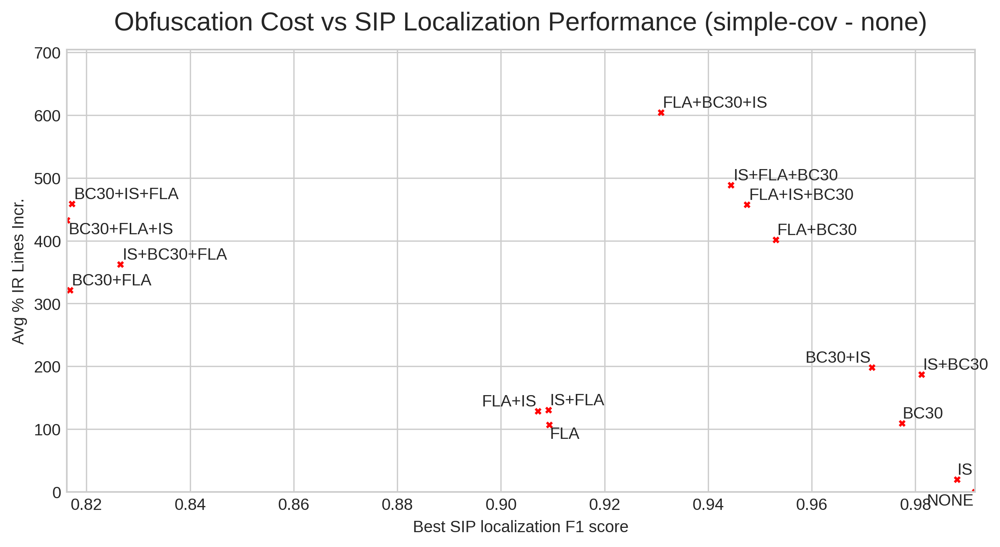

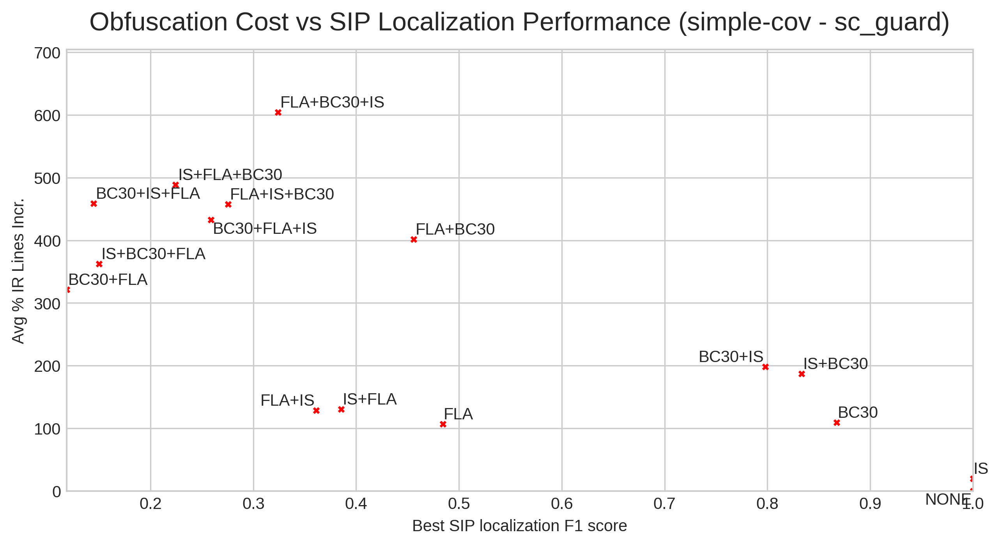

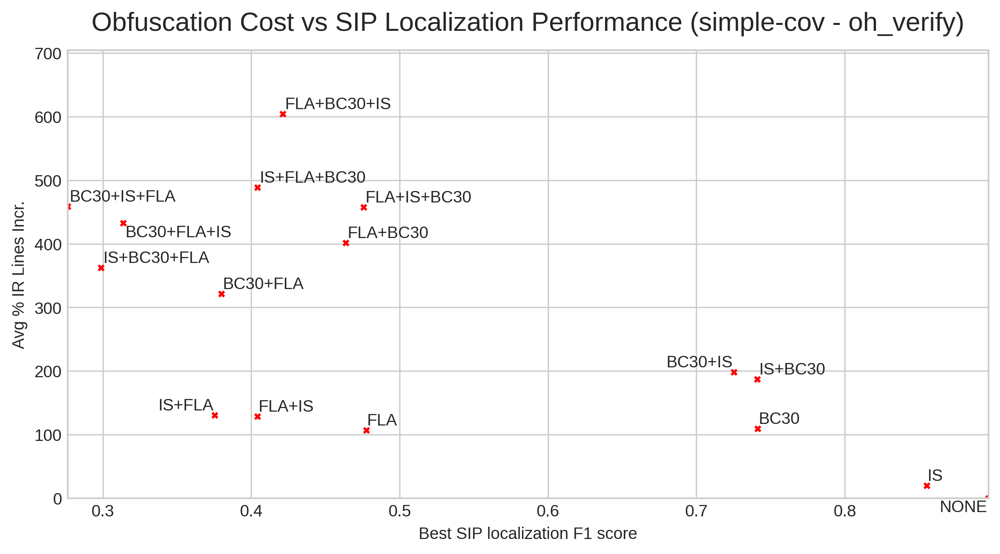

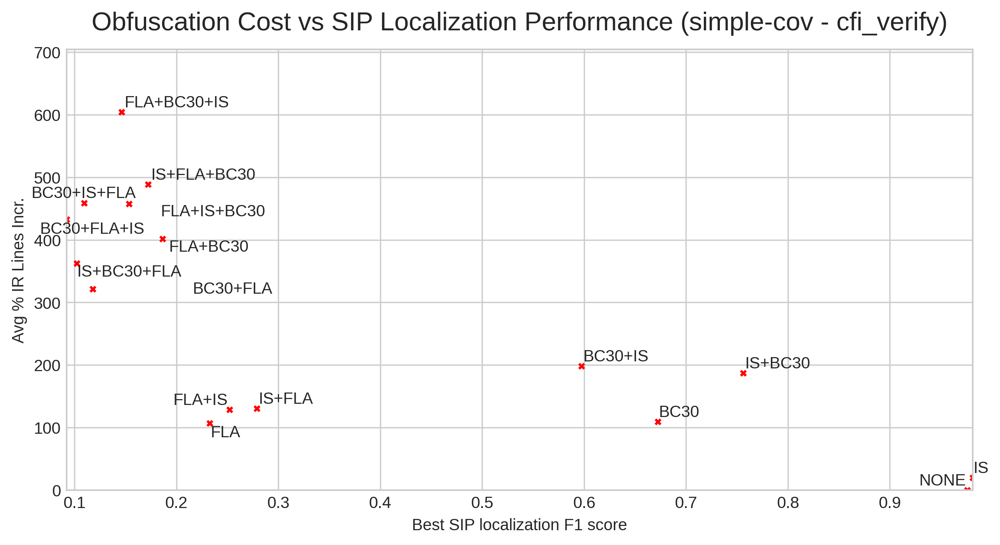

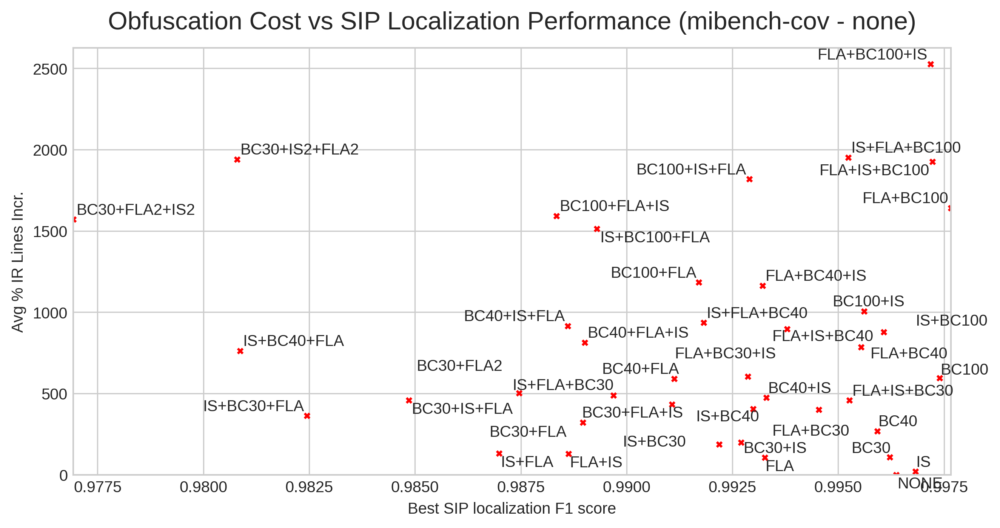

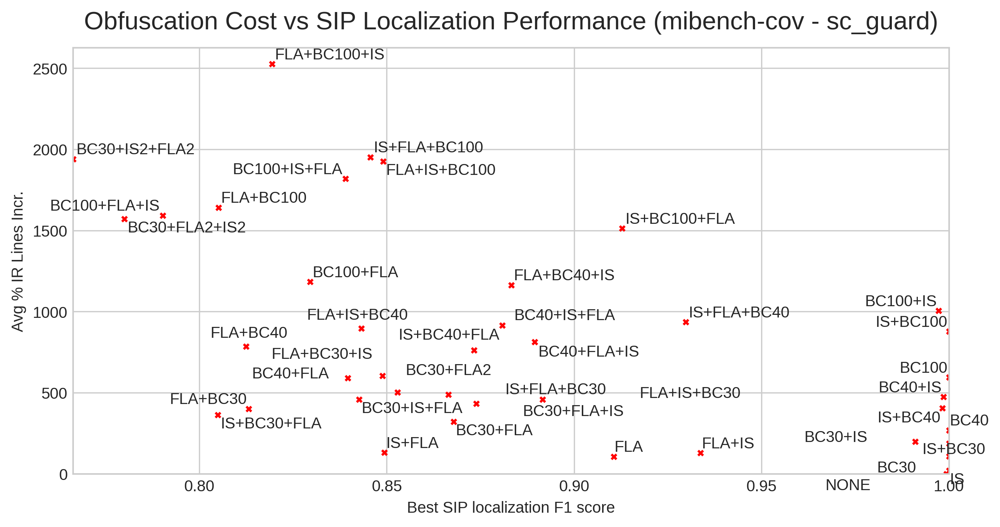

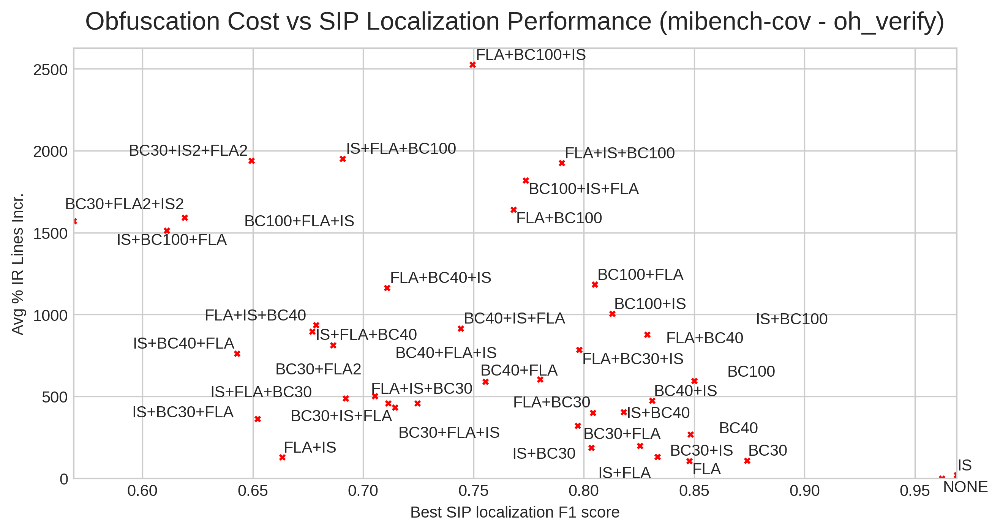

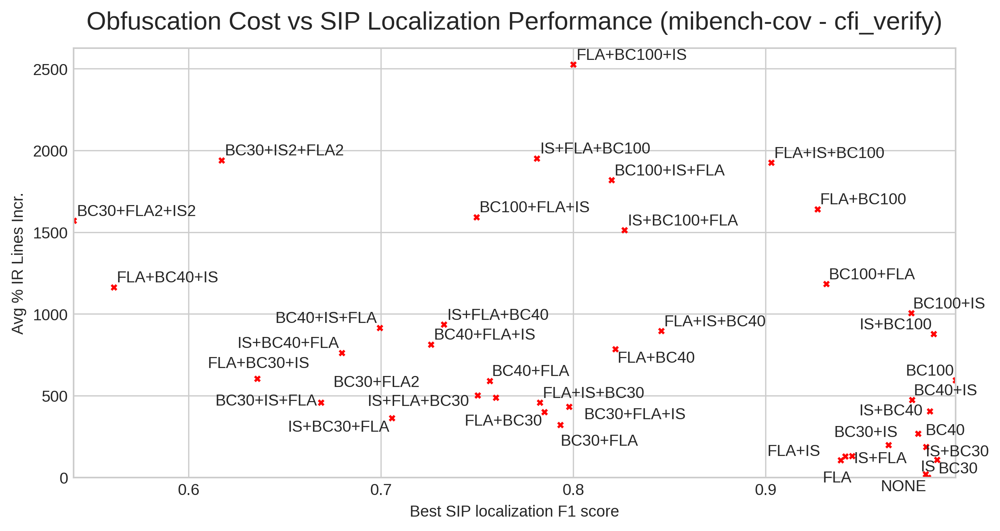

In [35]:
for src_dataset in ['simple-cov', 'mibench-cov']:
    for protection in ['none', 'sc_guard', 'oh_verify', 'cfi_verify']:
        plot_data = get_feature_obfuscation_results(
            df[(df['data_source'] == src_dataset)], protection
        )

        best_obfuscation_f1s = {}
        for obfuscation, protection_results in plot_data.items():
            vals = protection_results['pdg + tf_idf + ir2vec + code2vec']
            if len(vals) > 0:
                best_obfuscation_f1s[obfuscation] = median(vals) 
        
        title = f'Obfuscation Cost vs SIP Localization Performance ({src_dataset} - {protection})'
        file_name = f'plots/obfuscation_cost_vs_sip_performance_{src_dataset}_{protection}.pdf'
        draw_scatter_plot(best_obfuscation_f1s, obfs_stats, title, file_name)

In [36]:
def get_best_obfuscations_for(protection):
    obfs_stats_df = get_obfuscation_stats(labeled_bc_dir, 'mibench-cov')
    obfs_stats_df = obfs_stats_df[obfs_stats_df['Protection'] == protection.split('_')[0].upper()]  # e.g. SC
    
    obfs_stats = {}
    for _, row in obfs_stats_df.iterrows():
        obfs = row['Obfuscation']
        obfs_stats[obfs] = row['Avg % IR Lines Incr.']

    plot_data = get_feature_obfuscation_results(
        df[(df['data_source'] == 'mibench-cov')], protection
    )
    plot_data = {
        obfs: (mean(features_dict['pdg + tf_idf + ir2vec + code2vec']), round(obfs_stats[obfs] / 100 + 1.0, 1))
        for obfs, features_dict in plot_data.items()
    }
    plot_data = sorted(plot_data.items(), key=lambda x: x[1][1])

    def find_best_obfs(mult):
        candidates = [pd for pd in plot_data if pd[1][1] <= mult]
        if len(candidates) == 0:
            return None
        return min(candidates, key=lambda x: x[1][0])

    
#     max_multiplier = max(multiplier for _, (_, multiplier) in plot_data)
    max_multiplier = 35
    
    best_obfuscations = []
    prev_obfs = None
    for multiplier in range(1, int(max_multiplier) + 2):
        best_obfs = find_best_obfs(multiplier)
        if best_obfs is not None and best_obfs != prev_obfs:
            best_obfuscations.append((multiplier, best_obfs))
        prev_obfs = best_obfs

    return best_obfuscations

In [37]:
protections = ['sc_guard', 'oh_verify', 'cfi_verify']

best_protection_obfuscations = {}
for protection in protections:
    best_protection_obfuscations[protection] = get_best_obfuscations_for(protection)

In [38]:
best_protection_obfuscations

{'sc_guard': [(2, ('NONE', (0.9989437050693246, 1.9))),
  (3, ('IS', (0.9971879702925177, 2.2))),
  (5, ('IS+FLA', (0.8379219911427637, 4.7))),
  (10, ('IS+BC30+FLA', (0.7802652915797522, 9.7))),
  (25, ('BC30+IS2+FLA2', (0.7592642459573063, 24.8)))],
 'oh_verify': [(6, ('NONE', (0.9429627698184794, 5.7))),
  (11, ('FLA', (0.8382002775320609, 10.1))),
  (12, ('FLA+IS', (0.7135404920010866, 11.3))),
  (20, ('BC30+FLA2', (0.6715419456486926, 19.5))),
  (25, ('IS+BC30+FLA', (0.6344766231170398, 24.4))),
  (30, ('IS+BC40+FLA', (0.6095149782499731, 29.4)))],
 'cfi_verify': [(4, ('NONE', (0.9706642765783524, 3.3))),
  (8, ('FLA+IS', (0.9073121436243824, 7.5))),
  (14, ('BC30+FLA2', (0.7585872422667981, 13.9))),
  (16, ('IS+BC30+FLA', (0.7040590318478533, 15.4))),
  (18, ('IS+BC40+FLA', (0.6853140047583083, 17.6))),
  (23, ('FLA+BC30+IS', (0.6667110044239412, 22.1))),
  (27, ('FLA+BC40+IS', (0.5825809869712623, 26.9))),
  (33, ('BC30+FLA2+IS2', (0.5614415535668905, 32.6)))]}

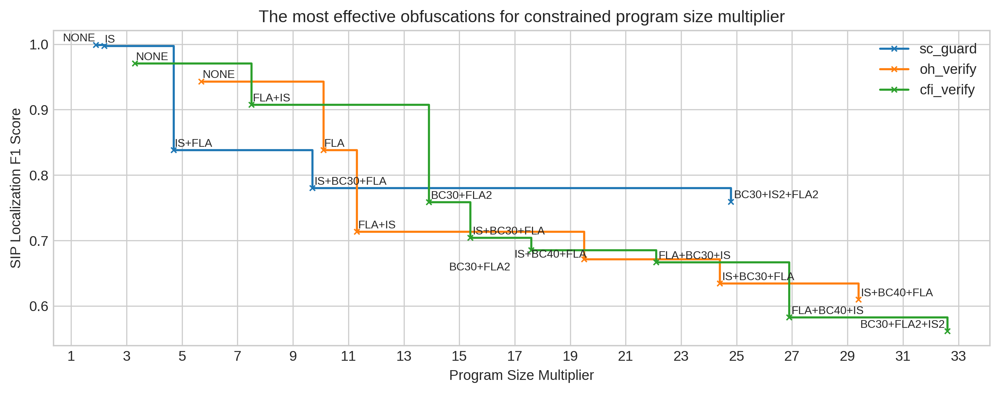

In [39]:
plt.figure(figsize=(10, 4), dpi=300)

plt.title("The most effective obfuscations for constrained program size multiplier")
plt.xlabel("Program Size Multiplier")
plt.ylabel("SIP Localization F1 Score")

texts = []

for protection in protections:
    best_obfuscations = best_protection_obfuscations[protection]
    
    x1 = [x[1][1][1] for x in best_obfuscations]
    y1 = [x[1][1][0] for x in best_obfuscations]
    plt.plot(x1, y1, marker='x', markersize=4, drawstyle='steps-post')

    texts += [plt.text(mul, f1, obfs, size=8) for _, (obfs, (f1, mul)) in best_obfuscations]

    
plt.xticks(np.arange(1, 35, 2))

plt.legend(protections, loc=1)
adjust_text(texts, only_move={'text': 'xy'})

plt.tight_layout()
plt.savefig('plots/most_effective_protection_and_obfuscation_mibench_cov.pdf')
plt.show()

## Research Question 5

In [40]:
results = [
    data for data in 
    find_results_json_files(labeled_bc_dir, lambda x: 'parallel' not in x.name)
    if data['features'] == ['pdg', 'tf_idf', 'ir2vec', 'code2vec'] and data['data_source'] == 'mibench-cov'
]

In [41]:
def decreasing_coefficient(vals):
    return vals[-2] - vals[-1] 


results = sorted(
    results, 
    key=lambda r: decreasing_coefficient(r['results']['history']['training_log']['val_loss']), 
    reverse=True
)

In [42]:
results[0]

{'data_source': 'mibench-cov',
 'data_dir': 'BCF40-FLA',
 'results': {'train_size': 223006,
  'test_size': 136236,
  'subject_groups_train': {'none': 215361,
   'oh_verify': 3628,
   'cfi_verify': 1985,
   'sc_guard': 2032},
  'subject_groups_test': {'none': 131283,
   'oh_verify': 2263,
   'cfi_verify': 1338,
   'sc_guard': 1352},
  'graph_info': 'StellarGraph: Undirected multigraph\n Nodes: 359242, Edges: 679147\n\n Node types:\n  default: [359242]\n    Features: float32 vector, length 947\n    Edge types: default-cfg->default\n\n Edge types:\n    default-cfg->default: [679147]\n        Weights: all 1 (default)\n        Features: none',
  'test_metrics': [{'name': 'loss', 'val:': 0.10540363937616348},
   {'name': 'acc', 'val:': 0.9696335792541504},
   {'name': 'categorical_accuracy', 'val:': 0.9696335792541504}],
  'classifier': {'sc_guard': 0.760931289040318,
   'cfi_verify': 0.6707946336429308,
   'oh_verify': 0.6883097088858406,
   'none': 0.9842677157435022},
  'history': {'epoch

In [43]:
def draw_line_chart(train_line, val_line, title, file_path=None):
    plt.figure(figsize=(10, 4), dpi=300)

    x1, y1 = range(1, len(train_line) + 1), train_line
    x2, y2 = range(1, len(val_line) + 1), val_line
    plt.plot(x1, y1, x2, y2, marker = 'o')

    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")

    plt.legend(['Training', 'Testing'], loc=1)

    plt.tight_layout()
    
    if file_path is not None:
        plt.savefig(file_path)
    
    plt.show()

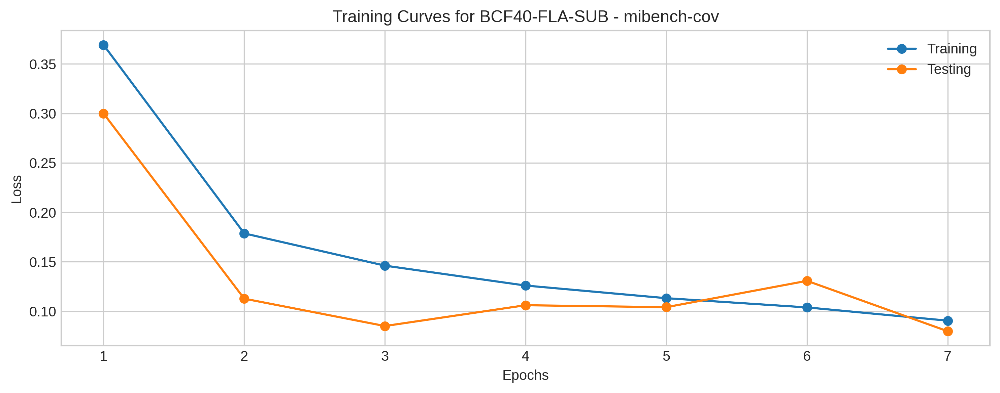

In [44]:
res = results[4]
res_log = res['results']['history']['training_log']
train_loss = res_log['loss']
val_loss = res_log['val_loss']
plot_title = f'Training Curves for {res["data_dir"]} - mibench-cov'
file_path = f'plots/training_curves_{res["data_dir"].replace("-", "_").lower()}_mibench_cov.pdf'

draw_line_chart(train_loss, val_loss, plot_title, file_path)

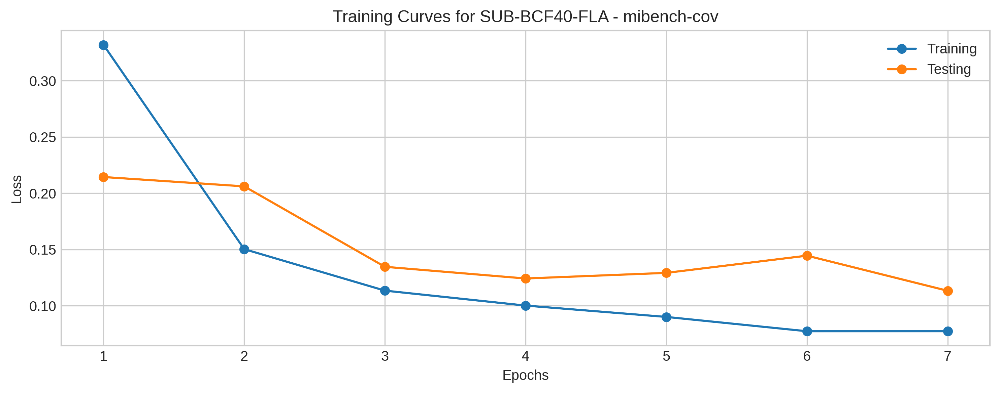

In [45]:
res = results[11]
res_log = res['results']['history']['training_log']
train_loss = res_log['loss']
val_loss = res_log['val_loss']
plot_title = f'Training Curves for {res["data_dir"]} - mibench-cov'
file_path = f'plots/training_curves_{res["data_dir"].replace("-", "_").lower()}_mibench_cov.pdf'

draw_line_chart(train_loss, val_loss, plot_title, file_path)

## Research Question 6

In [ ]:
df = reconcile_results_into_dataframe(
    find_results_json_files(labeled_bc_dir, lambda path: path.name.startswith('parallel'))
)


# source dataset -> list of obfuscations
obfuscation_orders = {}

src_dataset = 'simple-cov2'

plot_data = get_protection_obfuscation_results(
    df[df['features'] == 'pdg + tf_idf + ir2vec + code2vec']
)

# order obfuscations by mean box plot 
obfuscation_labels = sorted(
    plot_data.keys(), 
    key=lambda obfs: mean([median(protection_results) for protection_results in plot_data[obfs].values()]),
    reverse=True
)
obfuscation_orders[src_dataset] = obfuscation_labels

box_plots_order = ['none', 'sc_guard', 'oh_verify', 'cfi_verify']

part1_obfs_labels = obfuscation_labels[:20]
data_values = [[plot_data[obfs][prot] for obfs in part1_obfs_labels] for prot in box_plots_order]

plot_title = f'Best SIP Localizer F1 scores ({src_dataset})'

draw_plot(
    data_values, 
    part1_obfs_labels, 
    box_plots_order, 
    plot_title, 
#         file_name=f'plots/{src_dataset}_best_sip_localizer_f1_score_part_1.pdf'
)



part2_obfs_labels = obfuscation_labels[20:]
data_values = [[plot_data[obfs][prot] for obfs in part2_obfs_labels] for prot in box_plots_order]

draw_plot(
    data_values, 
    part2_obfs_labels, 
    box_plots_order, 
    plot_title=None, 
#         file_name=f'plots/{src_dataset}_best_sip_localizer_f1_score_part_2.pdf'
)